# Exploratory Data Analysis Notebook

## Introduction

<span style = "color:Red">**Climate change is REAL!!**</span> and has been at the top of our minds and on the forefront of important political decision-making for many years. It causes extreme weather fluctuations ,increasing pressure on wildlife to adapt to changing habitats and has serious impact on worlds water systems through more flooding and droughts.

Using the satellite images of cloud formations we can understand important climate variables which transcends the output we are trying to fathom which leads us to a better understanding of our environment and its changing patterns.

The idea of this project is fairly simple. 
There are different types or patterns of clouds, and our task is to identify them and classify these types.

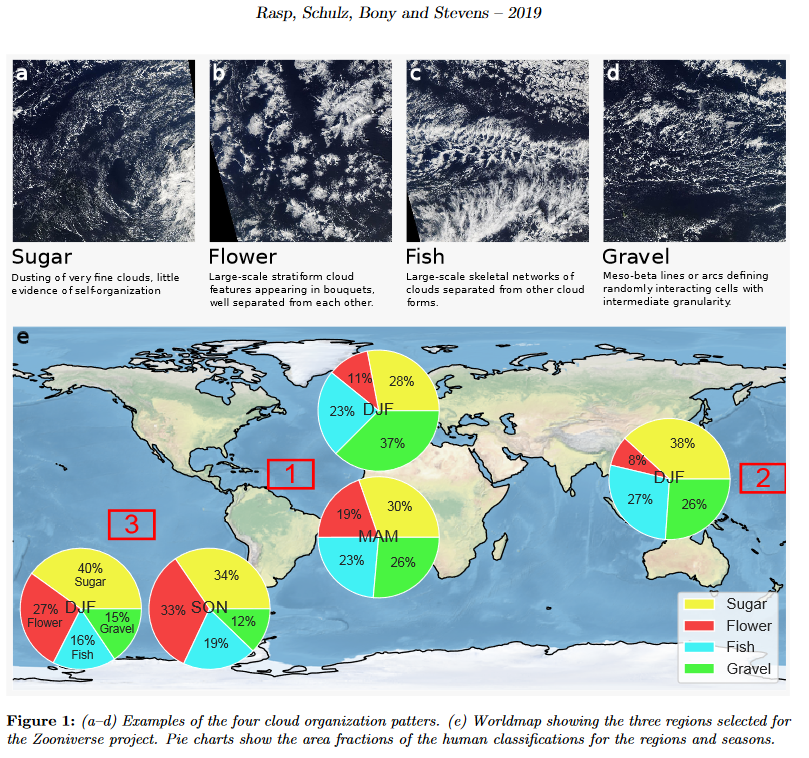

## Loading some important libraries needed for this EDA

In [1]:
import numpy as np
import pandas as pd
import os
import cv2

import matplotlib.pyplot as plt
from matplotlib import patches as patches

from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

from plotly import subplots
import plotly.express as px
import plotly.figure_factory as ff
from plotly.graph_objs import *
from plotly.graph_objs.layout import Margin, YAxis, XAxis
init_notebook_mode()
from glob import glob
from mlxtend.frequent_patterns import fpgrowth

In [2]:
pd.set_option('display.max_rows', 10000000)
pd.set_option('display.max_columns', 10000000)

In [3]:
print(os.getcwd())

C:\Users\Sashank\Projects_Data_Science\Clouds


## Data

<span style = "color:green">The images data was extracted from kaggle which was provided by Researchers at Max Planck.</span>
[Images_Dataset](https://www.kaggle.com/c/understanding_cloud_organization/data)

***Scientists, like those at Max Planck Institute for Meteorology, are leading the charge with new research on the world’s ever-changing atmosphere***

In [4]:
dir_path = 'C:/Users/Sashank/Projects_Data_Science/Clouds'

train_csv_path = os.path.join(dir_path, 'train.csv')
train_images_path = os.path.join(dir_path ,'train_images')
test_images_path = os.path.join(dir_path, 'test_images')

In [5]:
os.listdir(dir_path)

['.ipynb_checkpoints',
 'Cloud_pattern_prediction.ipynb',
 'sample_submission.csv',
 'test_images',
 'train.csv',
 'Train_enhanced.csv',
 'train_images']

**Number of Images we have in this data...** 

In [6]:
train_len = len(os.listdir(f'{dir_path}/train_images'))
test_len = len(os.listdir(f'{dir_path}/test_images'))

In [7]:
print(f'length of Train images : {train_len}')
print(f'length of Test images :{test_len}')

length of Train images : 5546
length of Test images :3698


### Plotting the split weightage between Train and Test Data

Text(0.5, 1.0, 'Train and Test split')

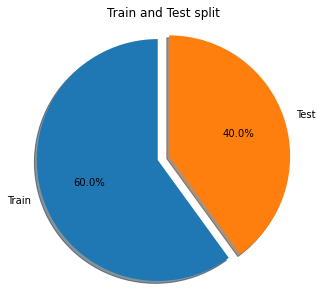

In [8]:
labels = 'Train', 'Test'
sizes = [train_len, test_len]
explode = (0, 0.1)

fig, ax = plt.subplots(figsize = (5,5))
ax.pie(sizes, explode = explode, labels = labels, autopct = '%1.1f%%', shadow = True, startangle = 90)
ax.axis('equal')
ax.set_title('Train and Test split')

In [9]:
Train_df = pd.read_csv(train_csv_path).fillna(-1)
Train_df.head()

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,-1
3,0011165.jpg_Sugar,-1
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...


In [10]:
Train_df.shape

(22184, 2)

In [11]:
Train_df.isna().sum()

Image_Label      0
EncodedPixels    0
dtype: int64

In [12]:
Train_df.EncodedPixels.count()

22184

In [13]:
print(f'There are {len(Train_df[Train_df.EncodedPixels == -1])} rows with empty segmentation maps')

There are 10348 rows with empty segmentation maps


### Exploring the Null values

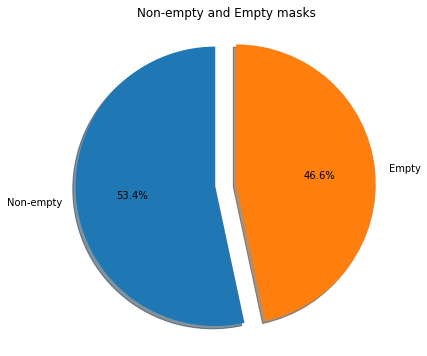

In [14]:
labels = 'Non-empty', 'Empty'
sizes = [len(Train_df[Train_df.EncodedPixels != -1]), len(Train_df[Train_df.EncodedPixels == -1])]
explode = (0, 0.15)

fig, ax = plt.subplots(figsize = (6,6))
ax.pie(sizes, explode = explode, labels = labels, autopct = '%1.1f%%', shadow = True, startangle = 90)
ax.axis('equal')
ax.set_title('Non-empty and Empty masks')

plt.show()

### Feature Engineering

In [15]:
Train_df['Image_id'] = Train_df['Image_Label'].apply(lambda x : x.split('_')[0])
Train_df['Label'] = Train_df['Image_Label'].apply(lambda x : x.split('_')[1])

In [16]:
Train_df.head()

,Image_Label,EncodedPixels,Image_id,Label
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower
2,0011165.jpg_Gravel,-1,0011165.jpg,Gravel
3,0011165.jpg_Sugar,-1,0011165.jpg,Sugar
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish


### Plotting the weightage of the different types of    cloud formation we have 

<ipython-input-17-a7dbb7d00e87>:11: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



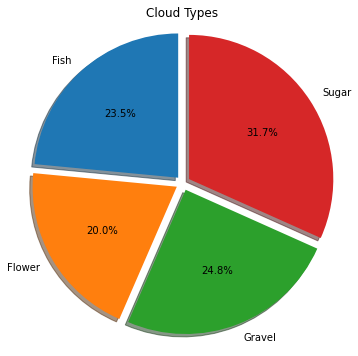

In [17]:
labels = 'Fish', 'Flower', 'Gravel', 'Sugar'

sizes = [len(Train_df[(Train_df['EncodedPixels'] != -1) & (Train_df['Label'] == 'Fish')]), len(Train_df[(Train_df['EncodedPixels'] != -1) & (Train_df['Label'] == 'Flower')]),len(Train_df[(Train_df['EncodedPixels'] != -1) & (Train_df['Label'] == 'Gravel')]), len(Train_df[(Train_df['EncodedPixels'] != -1) & (Train_df['Label'] == 'Sugar')])]
explode = (0.05,0.05,0.05,0.05)

fig, ax = plt.subplots(figsize = (6,6))

ax.pie(sizes, explode = explode, labels = labels, autopct = '%1.1f%%', shadow = True, startangle = 90)
ax.axis('equal')
ax.set_title('Cloud Types')
fig.show()

The inference we can gain from the above pie chart is that the labels are almost equally present or equally distributed which is good for the model as it can generalize better and makes our task easier

In [18]:
Train_df['Label_Encoded_Pixels'] = Train_df.apply(lambda row : (row['Label'], row['EncodedPixels']), axis = 1)

In [19]:
Train_df.head()

,Image_Label,EncodedPixels,Image_id,Label,Label_Encoded_Pixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish,"(Fish, 264918 937 266318 937 267718 937 269118..."
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower,"(Flower, 1355565 1002 1356965 1002 1358365 100..."
2,0011165.jpg_Gravel,-1,0011165.jpg,Gravel,"(Gravel, -1)"
3,0011165.jpg_Sugar,-1,0011165.jpg,Sugar,"(Sugar, -1)"
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish,"(Fish, 233813 878 235213 878 236613 878 238010..."


In [20]:
print('Total number of images : ', len(Train_df['Image_id'].unique()))

Total number of images :  5546


### Different types of clouds Formations

In [21]:
Train_df['Label'].unique()

array(['Fish', 'Flower', 'Gravel', 'Sugar'], dtype=object)

In [22]:
Train_df.groupby('Image_id')

In [23]:
grouped_EncodedPixels = Train_df.groupby('Image_id')['Label_Encoded_Pixels'].apply(list)

**As an image may contain more than 1 cloud formations type, it is good to see the count of total appearance of each formation in each image**

In [24]:
labels_per_image_count = grouped_EncodedPixels.apply(lambda x : len([x[0] for x in x if x[1] != -1])).value_counts()

In [25]:
labels_per_image_count

2    2372
3    1560
1    1348
4     266
Name: Label_Encoded_Pixels, dtype: int64

In [26]:
label_type_per_image = Train_df[Train_df['EncodedPixels']!= -1]['Label'].value_counts()
label_type_per_image

Sugar     3751
Gravel    2939
Fish      2781
Flower    2365
Name: Label, dtype: int64

**Out of the 4 we can see that <span style = "color:Orange">*Sugar*</span> appears more**

In [27]:
trace0 = Bar(x = labels_per_image_count.index, y = labels_per_image_count.values, name = 'Number of clouds Types per image',)

trace1 = Bar(x = label_type_per_image.index, y = label_type_per_image.values, name  = 'Number of images per class')

fig = subplots.make_subplots(rows = 1, cols = 2)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)

fig['layout'].update(height = 400, width = 900, title = 'Label Count and frequency per image')
iplot(fig)

#### <span style = "color:brown">Above are the bar plots of frequency and labels present per image</span>



# Diving Into EDA Of The Images

<span style = "color:red">I want to look at the following:</span>

- How does the mask for these formation looks like.
- Distribution / frequency of each types of clouds in our dataset

In [28]:
def rle_to_mask(rle_str, height, width):
    
    rows, cols = height, width
    
    if rle_str == -1:
        return np.zeros((rows, cols))
    
    else:
        rle_numbers = [int(num_str) for num_str in rle_str.split(' ')]
        
        rle_pairs = np.array(rle_numbers).reshape(-1, 2)
        
        img = np.zeros(rows*cols, dtype = np.uint8)
        
        for index, length in rle_pairs:
            index -= 1
            img[index : index + length] = 255
        
        img = img.reshape(cols, rows)
        img = img.T
        return img

**Reading a single image and plotting its mask to paint a basic idea of what it looks like**

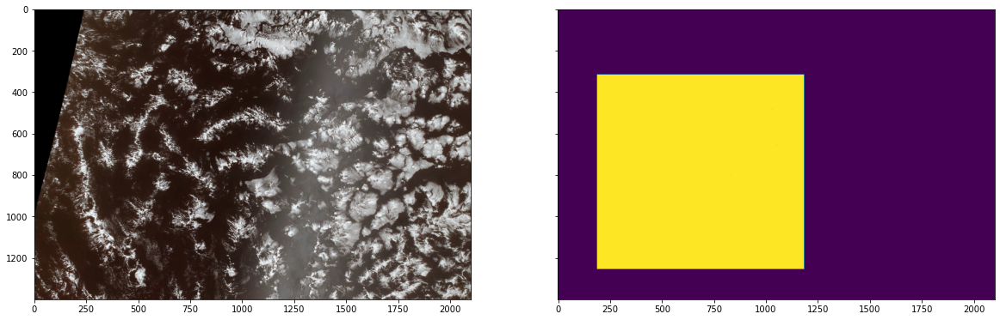

In [29]:
img = cv2.imread(os.path.join(train_images_path, Train_df['Image_id'][0]))

mask_decoded = rle_to_mask(Train_df['Label_Encoded_Pixels'][0][1], img.shape[0], img.shape[1])

fig, ax = plt.subplots(nrows= 1, ncols= 2, sharey= True, figsize = (20,10))

ax[0].imshow(img)
ax[1].imshow(mask_decoded)

> *Visualizing has revealed us that the mask does not accurately mark the boundaries of the formation but it roughly covers the area of it.*

**Since our early analysis has brought into the light of the fact that an image can contain more than one type of formations, we can plot them in two columns which shows the different types of cloud formations with its bounding box on the first column and the same picture with its mask displayed on the second column** 

In [30]:
def bounding_box(img):
    rows = np.any(img, axis = 1)
    cols = np.any(img, axis = 0)
    
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]
    
    return rmin, rmax, cmin, cmax

In [31]:
def plot_cloud(img_path, img_id, label_mask):
    img = cv2.imread(os.path.join(img_path, img_id))
    
    fig, ax = plt.subplots(nrows= 1, ncols= 2, sharey= True, figsize = (20,10))
    
    ax[0].imshow(img)
    ax[1].imshow(img)
    
    cmaps = {'Fish' : 'Blues', 'Flower' : 'Purples', 'Gravel' : 'Greys', 'Sugar' : 'Reds'}
    colors = {'Fish' : 'Blue', 'Flower' : 'Purple', 'Gravel' : 'Grey', 'Sugar' : 'Red'}
    
    for label , mask in label_mask:
        
        mask_decoded = rle_to_mask(mask, img.shape[0], img.shape[1])
        
        if mask != -1:
            
            rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
            
            bbox = patches.Rectangle((cmin, rmin), cmax-cmin, rmax-rmin, linewidth = 1, edgecolor = colors[label], facecolor = 'None')
            
            ax[0].add_patch(bbox)
            ax[0].text(cmin, rmin, label, bbox = dict(fill = True, color = colors[label]))
            
            ax[1].imshow(mask_decoded, alpha = 0.3, cmap = cmaps[label])

*Lets plot 10 different samples to verify*

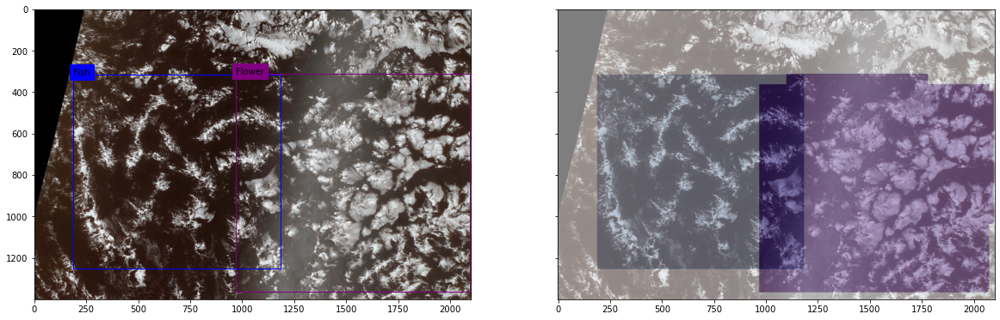

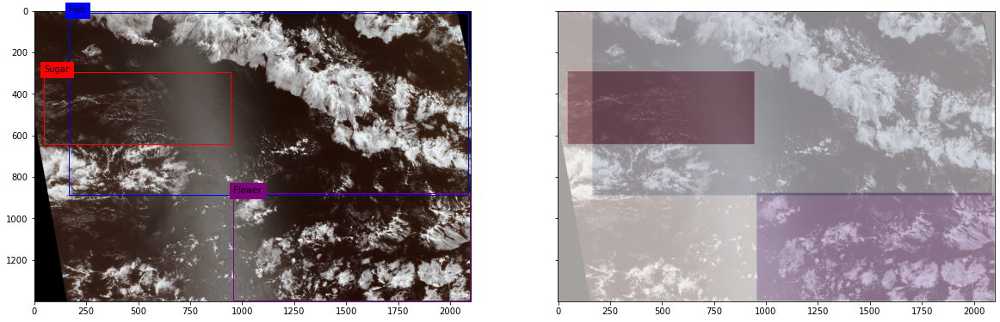

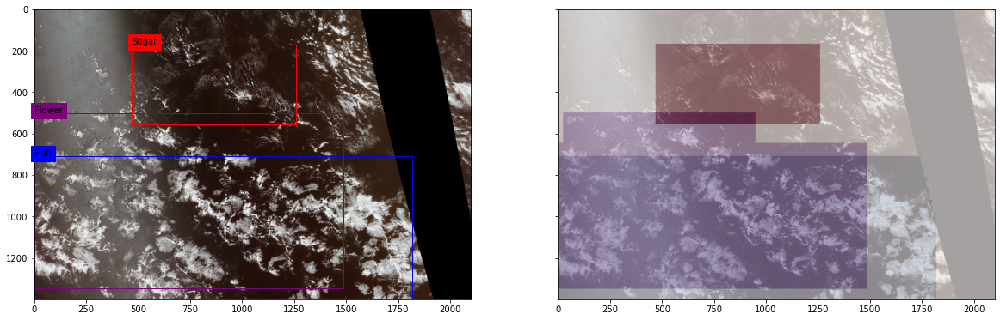

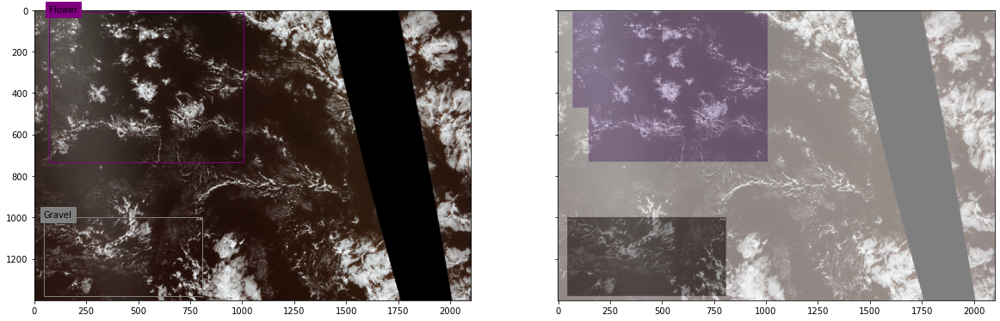

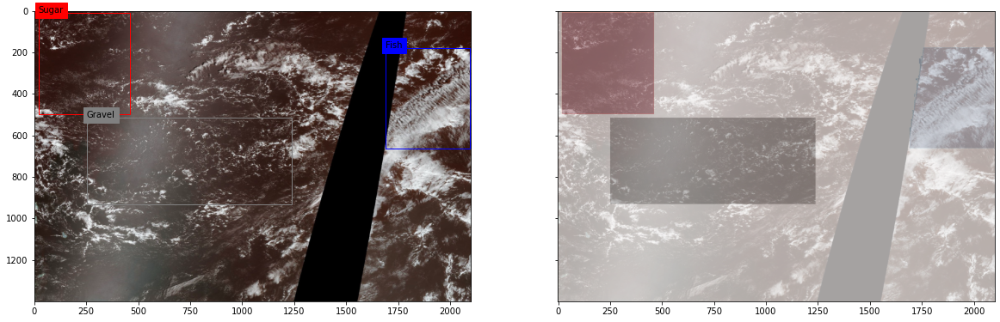

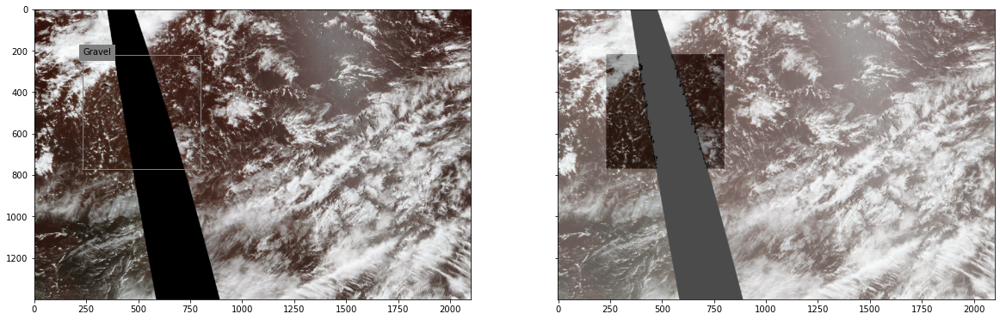

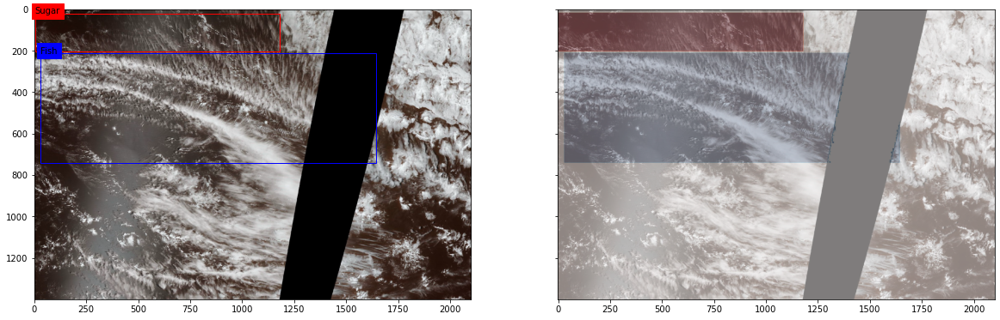

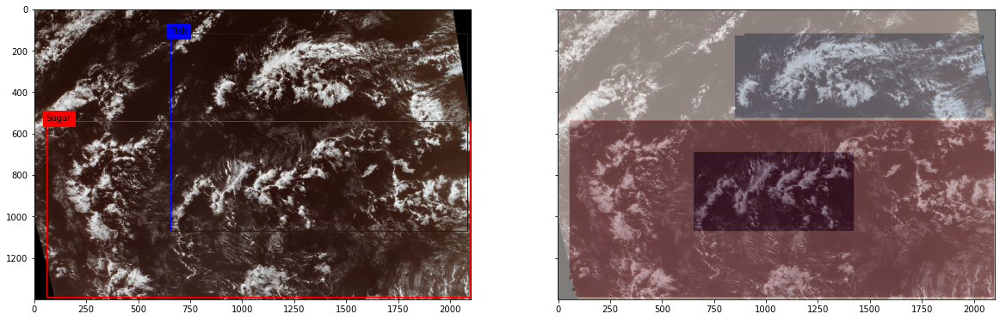

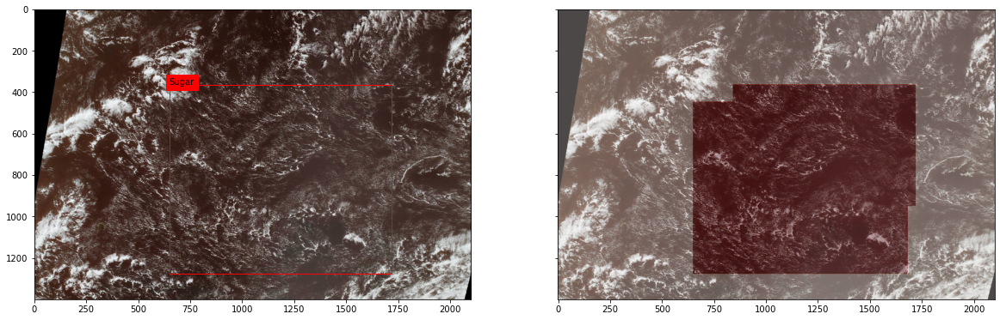

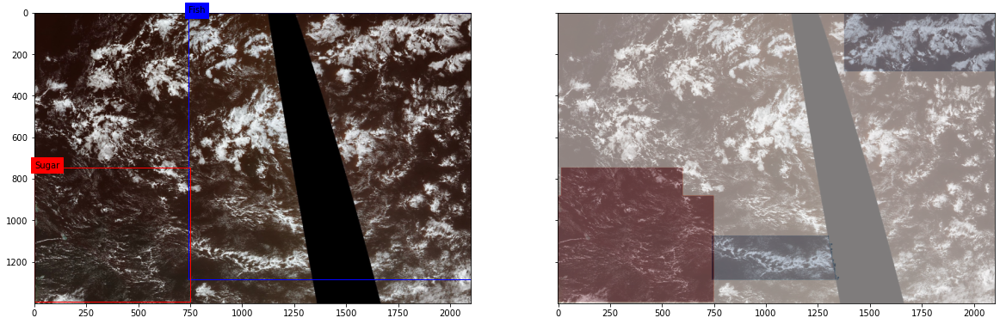

In [32]:
for image_id , label_mask in grouped_EncodedPixels[:10].iteritems():
    plot_cloud(train_images_path, image_id, label_mask)

### Taking a Look At The Cloud Formations

> <span style = "color:green">*Lets take a look at how the different types of cloud formations looks like to the naked eye*</span>

**We can do that by getting the mask of the formations and mute out the region of color which we don't need**

In [33]:
def get_mask_cloud(img_path, img_id,label, mask):
    img = cv2.imread(os.path.join(img_path, image_id), 0)
    mask_decoded = rle_to_mask(mask, img.shape[0], img.shape[1])
    
    mask_decoded = (mask_decoded > 0.0).astype(int)
    img = np.multiply(img, mask_decoded)
    
    return img

In [34]:
def draw_label_only(label):
    
    sample_df = Train_df[(Train_df['EncodedPixels'] != -1) & (Train_df['Label'] == label)].sample(2)
    
    count = 0
    fig, ax = plt.subplots(nrows= 1, ncols= 2, sharey = True, figsize = (20,10))
    
    for idx, sample in sample_df.iterrows():
        img = get_mask_cloud(train_images_path, sample['Image_id'], sample['Label'], sample['EncodedPixels'])
        ax[count].imshow(img, cmap = 'gray')
        count += 1


**<span style = "color:Orange">Sugar</span> Cloud Formation**

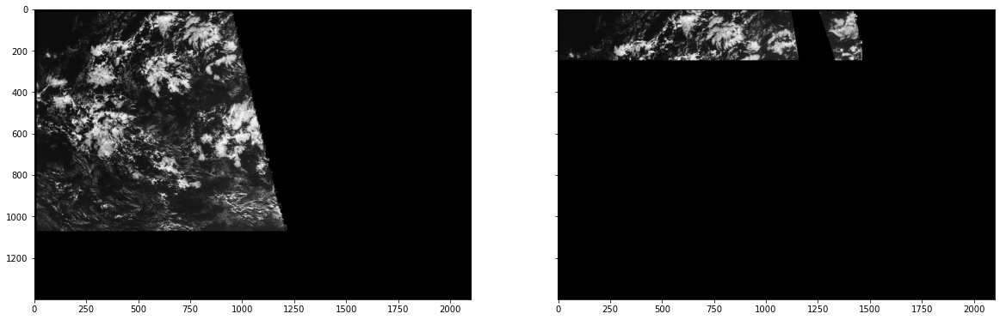

In [35]:
draw_label_only('Sugar')

**<span style = "color:blue">Fish</span> Cloud Formation**

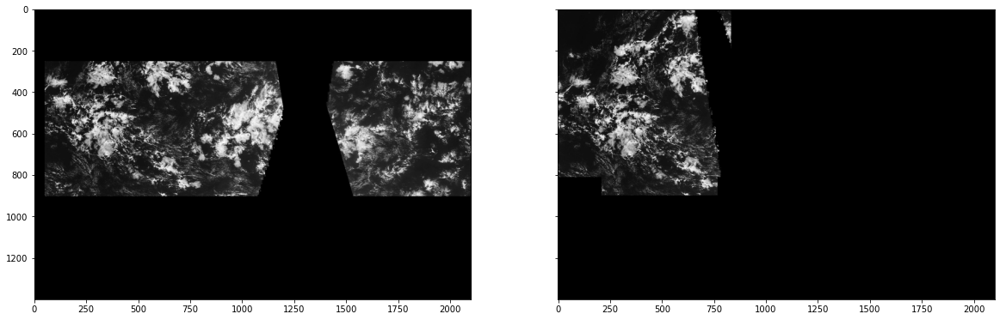

In [36]:
draw_label_only('Fish')

**<span style = 'color:Violet'>Flower</span> Cloud Formation**

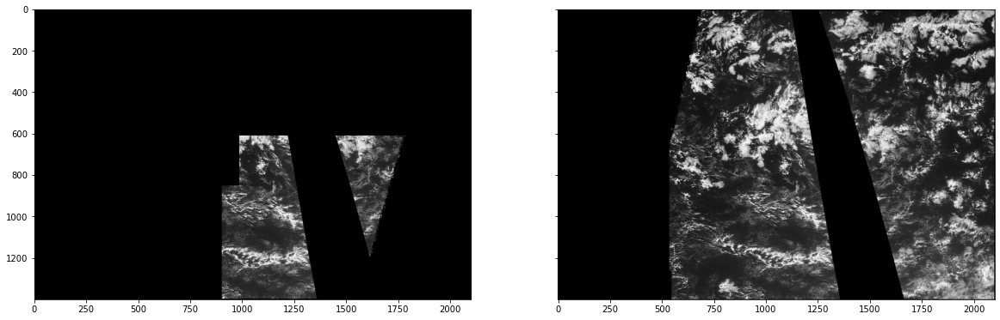

In [37]:
draw_label_only('Flower')

**<span style = "color:Gray">Gravel</span> Cloud Formation**

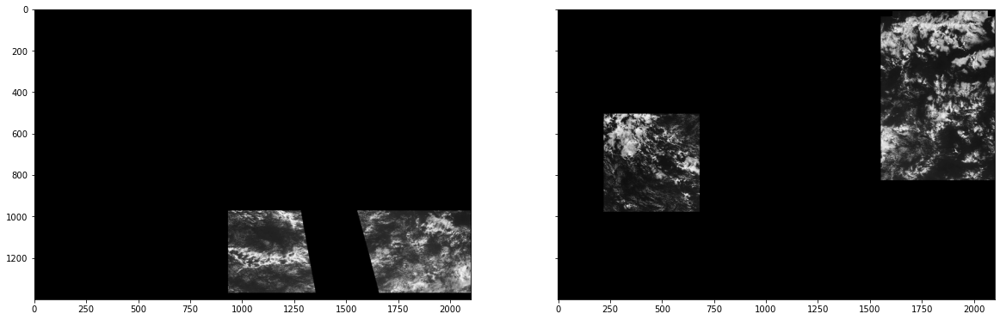

In [38]:
draw_label_only('Gravel')

### Cloud That Forms Together Stays Together

*As analyzed in the previous visualizations, it's highly common for multiple cloud formations to be present in a single image. In this section we want to answer:*

- `Which cloud formations occur frequently.`


- `Which cloud formations are least likely to be present together.`

**To do this, we will use a data mining algorithm called *Frequent Pattern Mining*. FP Growth is a particular algorithmic implementation of Frequent Pattern, which aims to identify items that appear frequently together in a list.**



In [39]:
label_per_image = grouped_EncodedPixels.apply(lambda encoded_list : [x[0] for x in encoded_list if x[1] != -1])

In [40]:
len(label_per_image)

5546

In [41]:
label_per_image[:10]

Image_id
0011165.jpg           [Fish, Flower]
002be4f.jpg    [Fish, Flower, Sugar]
0031ae9.jpg    [Fish, Flower, Sugar]
0035239.jpg         [Flower, Gravel]
003994e.jpg    [Fish, Gravel, Sugar]
00498ec.jpg                 [Gravel]
006bf7c.jpg            [Fish, Sugar]
006c5a6.jpg            [Fish, Sugar]
008233e.jpg                  [Sugar]
008a5ff.jpg            [Fish, Sugar]
Name: Label_Encoded_Pixels, dtype: object

In [42]:
label_per_image_list = []

for r in label_per_image.items():
    label_count = {'Fish' : 0, 'Flower': 0, 'Gravel' : 0, 'Sugar' : 0}
    
    for image_label in r[1]:
        label_count[image_label] = 1
    label_per_image_list.append(label_count)

In [43]:
label_per_image_list[:10]

[{'Fish': 1, 'Flower': 1, 'Gravel': 0, 'Sugar': 0},
 {'Fish': 1, 'Flower': 1, 'Gravel': 0, 'Sugar': 1},
 {'Fish': 1, 'Flower': 1, 'Gravel': 0, 'Sugar': 1},
 {'Fish': 0, 'Flower': 1, 'Gravel': 1, 'Sugar': 0},
 {'Fish': 1, 'Flower': 0, 'Gravel': 1, 'Sugar': 1},
 {'Fish': 0, 'Flower': 0, 'Gravel': 1, 'Sugar': 0},
 {'Fish': 1, 'Flower': 0, 'Gravel': 0, 'Sugar': 1},
 {'Fish': 1, 'Flower': 0, 'Gravel': 0, 'Sugar': 1},
 {'Fish': 0, 'Flower': 0, 'Gravel': 0, 'Sugar': 1},
 {'Fish': 1, 'Flower': 0, 'Gravel': 0, 'Sugar': 1}]

FP calculation

In [44]:
label_per_image_df = pd.DataFrame(label_per_image_list)
label_per_image_df.head()

,Fish,Flower,Gravel,Sugar
0,1,1,0,0
1,1,1,0,1
2,1,1,0,1
3,0,1,1,0
4,1,0,1,1


In [45]:
label_fp_df = fpgrowth(label_per_image_df, use_colnames= True, min_support = 0.001)
label_fp_df.head(3)

,support,itemsets
0,0.501442,(Fish)
1,0.426433,(Flower)
2,0.676343,(Sugar)


In [46]:
label_fp_df = label_fp_df.sort_values(by =['support'])
label_fp_df.head()

,support,itemsets
13,0.047962,"(Fish, Flower, Gravel, Sugar)"
12,0.076271,"(Fish, Flower, Gravel)"
10,0.107104,"(Fish, Flower, Sugar)"
11,0.110891,"(Flower, Gravel, Sugar)"
9,0.166967,"(Flower, Gravel)"


In [47]:
label_combined_fp_df = label_fp_df[label_fp_df['itemsets'].apply(lambda x : len(x) > 1)]
label_combined_fp_df['itemsets'] = label_combined_fp_df['itemsets'].apply(lambda x : ','.join(x))

In [48]:
label_combined_fp_df.head(5)

,support,itemsets
13,0.047962,"Fish,Flower,Gravel,Sugar"
12,0.076271,"Fish,Flower,Gravel"
10,0.107104,"Fish,Flower,Sugar"
11,0.110891,"Flower,Gravel,Sugar"
9,0.166967,"Flower,Gravel"


In [49]:
fig = px.bar(label_combined_fp_df, x = 'support', y='itemsets', orientation = 'h',
             title = 'Frequent Patterns of The Cloud Formation',color_discrete_sequence =['blueviolet'])

fig.show()

**Sugar formation appears the most in the images along with Gravel or Fish. It also appears with Flower but its less frequent compared to other formations.**

> <span style = "color:blue">*Combination of all the formations in one image is probable but its less likely to occur*</span>

### Surface Area Ratio Per Cloud formation

In this following section our agenda is as follows:

- ` To check the distribution of the surface area for different cloud formation masks.`


- `To see for cloud formations that occur frequently but has a less surface area in our dataset`

In [50]:
def binary_mask_sum(encoded_mask):
    mask_decoded = rle_to_mask(encoded_mask, width = 2100, height = 1400)
    binary_mask = (mask_decoded>0.0).astype(int)
    return binary_mask.sum()

In [51]:
#Train_df_new['mask_pixel_sum'] = Train_df_new.apply(lambda x : binary_mask_sum(x['EncodedPixels']), axis = 1)

In [52]:
Train_df = pd.read_csv('Train_enhanced.csv')

In [53]:
Train_df.head()

,Unnamed: 0,Image_Label,EncodedPixels,Image_id,Label,Label_Encoded_Pixels,mask_pixel_sum
0,0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish,"('Fish', '264918 937 266318 937 267718 937 269...",932312
1,1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower,"('Flower', '1355565 1002 1356965 1002 1358365 ...",1156107
2,2,0011165.jpg_Gravel,-1,0011165.jpg,Gravel,"('Gravel', -1)",0
3,3,0011165.jpg_Sugar,-1,0011165.jpg,Sugar,"('Sugar', -1)",0
4,4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish,"('Fish', '233813 878 235213 878 236613 878 238...",1684325


In [54]:
fig = px.histogram(Train_df[Train_df['mask_pixel_sum']!=0][['Label','mask_pixel_sum']], 
                   x="mask_pixel_sum", color="Label", marginal="box")

fig['layout'].update(title='Histogram and Boxplot of Sum of Mask Pixels Per Cloud Formation', yaxis_title="Count of label")

fig.show()

#### As you can infer from the above histogram 

- `Gravel has the highest surface area than other types.`


- `Fish formation even though it has the highest frequency of presence its surface area is the lowest.` 

## Thats The End of This EDA Notebook

> <span style = "color: Green">**With this our Exploratory Data Analysis is over, We got the necessary information and gained some inference about the Dataset which helps us further in choosing the algorithm and building a tailored model**</span>

<span style = "color:Red">*We will continue our model building in google colab beacuse the training is faster than my CPU as colab offers TPU service*</span>